# Gyimah's EDA

In [28]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load the data
df = pd.read_csv('/kaggle/input/train-1/Trai.csv')

# Display basic information about the dataset
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74005 entries, 0 to 74004
Data columns (total 76 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   ID_LAT_LON_YEAR_WEEK                                      74005 non-null  object 
 1   latitude                                                  74005 non-null  float64
 2   longitude                                                 74005 non-null  float64
 3   year                                                      74005 non-null  int64  
 4   week_no                                                   74005 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  72075 non-null  float64
 6   SulphurDioxide_SO2_column_number_density_amf              72075 non-null  float64
 7   SulphurDioxide_SO2_slant_column_number_density            72075 non-null  float64
 8   SulphurDioxide_c

In [29]:
# Show the first few rows of the data
df.head()



,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-23.73_28.77_2019_1,-23.73,28.77,2019,1,0.000167,0.713172,0.000102,0.223929,24.939440,...,5566.222019,54826.032616,4606.209995,19.115282,0.353778,24.951948,49.053953,-89.638032,17.988874,86.051700
1,ID_-23.73_28.77_2019_2,-23.73,28.77,2019,2,-0.000155,0.812910,-0.000137,0.080281,16.624162,...,3711.511365,68491.753342,3034.461661,12.218664,0.244987,4.708856,42.586683,-89.904314,22.773246,88.875670
2,ID_-23.73_28.77_2019_3,-23.73,28.77,2019,3,-0.000065,0.860306,-0.000062,0.161050,-13.237244,...,2136.385189,78967.739548,1433.482587,6.062737,0.245102,76.060628,34.737544,-83.595254,17.437300,91.723114
3,ID_-23.73_28.77_2019_4,-23.73,28.77,2019,4,0.000152,0.422284,0.000087,0.046504,-13.534653,...,3841.853018,64592.806769,2878.512917,6.388233,0.210904,75.912368,60.294490,-71.896728,11.977818,92.883870
4,ID_-23.73_28.77_2019_5,-23.73,28.77,2019,5,0.000024,1.004578,0.000028,0.214246,-13.475718,...,1295.688171,86804.025391,1094.665344,9.206252,0.261103,-13.346079,50.194493,-77.462082,24.374270,94.878330


In [30]:

# Display summary statistics
df.describe()


,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
count,74005.000000,74005.000000,74005.000000,74005.000000,72075.000000,72075.000000,72075.000000,72075.000000,72075.000000,72075.000000,...,71281.000000,71281.000000,71281.000000,71281.000000,71281.000000,71281.000000,71281.000000,71281.000000,71281.000000,7.400500e+04
mean,-27.829723,27.782742,2020.478049,26.156098,0.000263,0.515875,0.000091,0.105690,4.487627,45.324730,...,3652.349722,74390.624457,2871.262815,15.825386,0.225441,-14.277119,49.567836,-50.513220,40.558959,7.891061e+03
std,2.760589,2.746672,1.111261,14.843840,0.000599,0.196766,0.000199,0.069555,52.246537,14.757472,...,1807.385280,12859.067332,1645.827671,19.696645,0.063131,47.277321,12.097417,20.623907,12.201179,5.257160e+04
min,-33.930000,21.070000,2019.000000,1.000000,-0.000989,0.133738,-0.000828,0.000000,-110.027657,0.099529,...,128.299794,14541.977986,10.300364,1.151138,0.000000,-125.298058,0.100882,-97.570906,10.906227,4.806346e-02
25%,-29.630000,26.670000,2019.000000,13.000000,-0.000066,0.371745,-0.000034,0.052482,-18.178128,32.971126,...,2260.917450,65920.340500,1602.615232,5.071849,0.183490,-31.952090,41.329129,-67.987723,29.786592,1.545472e+02
50%,-28.130000,28.770000,2020.000000,26.000000,0.000147,0.488695,0.000073,0.099513,-10.987544,48.226275,...,3437.878915,75994.802018,2563.926290,8.609041,0.223503,-13.738030,53.233031,-45.413921,40.117572,7.231359e+02
75%,-25.730000,29.470000,2021.000000,39.000000,0.000441,0.623530,0.000191,0.152480,59.119988,59.366053,...,4745.607936,84409.691135,3819.671389,17.478625,0.267716,3.790391,59.478133,-33.124961,51.445698,2.773029e+03
max,-23.730000,31.170000,2022.000000,52.000000,0.009526,1.673412,0.001871,0.299987,83.743980,66.372093,...,15674.424150,102267.150980,14674.423209,250.000000,0.754331,127.483161,66.564613,-14.170015,69.605114,1.181701e+06


The dataset OBSERVED contains 74,005 entries with 76 columns, including various atmospheric measurements from Sentinel-5P satellite observations.

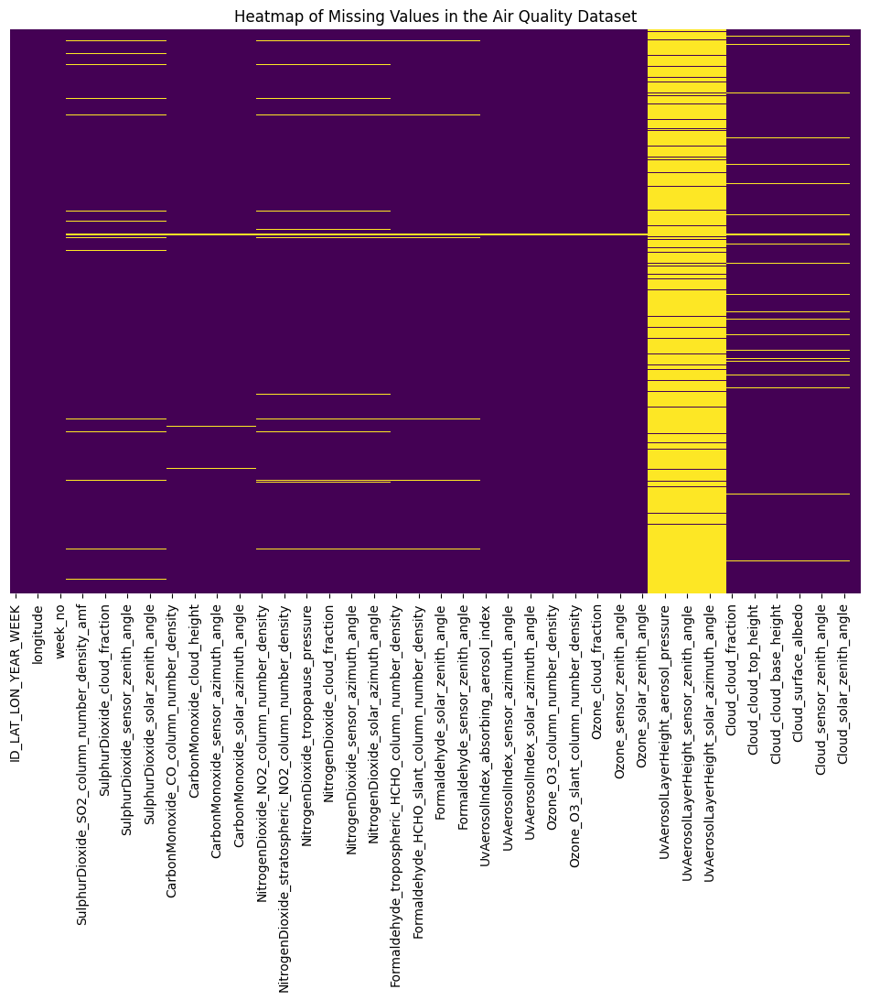

In [31]:
# Required imports
import seaborn as sns
import matplotlib.pyplot as plt


# Visualize missing values
plt.figure(figsize=(12, 8))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Heatmap of Missing Values in the Air Quality Dataset')
plt.show()



In [32]:
# Calculating the percentage of missing values
missing_percent = df.isnull().mean() * 100

# Displaying columns with missing data and their percentages
missing_data = missing_percent[missing_percent > 0]
print("Percentage of Missing Data Per Column:")
missing =pd.DataFrame(missing_data)
missing



Percentage of Missing Data Per Column:


,0
SulphurDioxide_SO2_column_number_density,2.607932
SulphurDioxide_SO2_column_number_density_amf,2.607932
SulphurDioxide_SO2_slant_column_number_density,2.607932
SulphurDioxide_cloud_fraction,2.607932
SulphurDioxide_sensor_azimuth_angle,2.607932
...,...
Cloud_surface_albedo,3.680832
Cloud_sensor_azimuth_angle,3.680832
Cloud_sensor_zenith_angle,3.680832
Cloud_solar_azimuth_angle,3.680832


In [33]:
# Save the missing percentage into summary to help in my feature engineering to create threshold
missing_data.reset_index().to_csv('missing_data_summary.csv', index=False)

print("Missing values analysis completed.")

Missing values analysis completed.


In [34]:
# Converting 'year' and 'week_no' to datetime
df['date'] = pd.to_datetime(df['year'].astype(str) + '-' + df['week_no'].astype(str) + '-1', format='%Y-%W-%w')
df['month'] = df['date'].dt.month

# Select relevant columns for analysis
pollutants = ['SulphurDioxide_SO2_column_number_density', 'CarbonMonoxide_CO_column_number_density', 
              'NitrogenDioxide_NO2_column_number_density', 'Formaldehyde_tropospheric_HCHO_column_number_density',
              'Ozone_O3_column_number_density']



# 1. Time series plot of pollutants

In [35]:

fig = go.Figure()
for pollutant in pollutants:
    df_mean = df.groupby('date')[pollutant].mean().reset_index()
    fig.add_trace(go.Scatter(x=df_mean['date'], y=df_mean[pollutant], name=pollutant))

fig.update_layout(title='Time Series of Pollutants', xaxis_title='Date', yaxis_title='Concentration')
fig.write_html("time_series_pollutants.html")
fig.show()

# 2. Correlation heatmap

In [36]:
# 2. Correlation heatmap
correlation = df[pollutants].corr()
fig = px.imshow(correlation, text_auto=True, aspect="auto")
fig.update_layout(title='Correlation Heatmap of Pollutants')
fig.write_html("correlation_heatmap.html")
fig.show()

# 3 Month Feature for Cross Validation


In [37]:
#  Month Feature for Cross Validation
monthly_emissions = df.groupby('month')['emission'].mean().reset_index()
fig = px.bar(monthly_emissions, x='month', y='emission', title='Average Emissions by Month')
fig.write_html("monthly_emissions.html")
fig.show()

# 4. Rolling means analysis

In [38]:
# 5. Rolling means analysis
for window in [17, 39, 52]:
    df[f'emission_rolling_{window}'] = df.groupby('latitude')['emission'].transform(lambda x: x.rolling(window=window, min_periods=1).mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['date'], y=df['emission'], mode='lines', name='Original'))
fig.add_trace(go.Scatter(x=df['date'], y=df['emission_rolling_17'], mode='lines', name='17-week rolling mean'))
fig.add_trace(go.Scatter(x=df['date'], y=df['emission_rolling_39'], mode='lines', name='39-week rolling mean'))
fig.add_trace(go.Scatter(x=df['date'], y=df['emission_rolling_52'], mode='lines', name='52-week rolling mean'))
fig.update_layout(title='Rolling Means of Emissions', xaxis_title='Date', yaxis_title='Emission')
fig.write_html("rolling_means.html")

fig.show()

**NOTE**


1. Time series of pollutants: This plot reveals trends and patterns in pollutant concentrations over time, allowing for the identification of seasonal variations or long-term trends.

2. Correlation heatmap: This visualization shows the relationships between different pollutants, which helped ME understand how they interact or share common sources.

3. Monthly emissions: The bar chart of average emissions by month can highlight seasonal patterns in pollution levels.

4. Rolling means: Curoius to the rolling means analysis (17, 39, and 52-week windows) which was inspired a friend of mine to helps smooth out short-term fluctuations and reveal longer-term trends in emissions data. This is particularly useful for: aND IT WILL BE A KEY in FEATURE ENGINEERING
   - Identifying overall trends while reducing noise
   - Comparing different time scales (e.g., quarterly, semi-annual, annual)
   - Potentially revealing cyclical patterns that might not be apparent in raw data



# 5. Geo Visualization

In [39]:
# 2. Geo Visualization
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="emission",
                        size="emission", zoom=3, height=600)
fig.update_layout(mapbox_style="open-street-map", title="Spatial Distribution of Emissions")
fig.write_html("geo_visualization.html")
fig.show()

In [40]:

# Summary statistics
summary = df[pollutants + ['emission']].describe()
print("\
Summary Statistics:")
print(summary)

# Checking for outliers (using IQR method)
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return len(outliers)



Summary Statistics:
       SulphurDioxide_SO2_column_number_density  \
count                              72075.000000   
mean                                   0.000263   
std                                    0.000599   
min                                   -0.000989   
25%                                   -0.000066   
50%                                    0.000147   
75%                                    0.000441   
max                                    0.009526   

       CarbonMonoxide_CO_column_number_density  \
count                             73447.000000   
mean                                  0.025280   
std                                   0.005954   
min                                   0.011216   
25%                                   0.021483   
50%                                   0.023638   
75%                                   0.027364   
max                                   0.067274   

       NitrogenDioxide_NO2_column_number_density  \
count            

In [41]:
print("\
Number of outliers in each pollutant:")
for pollutant in pollutants + ['emission']:
    print(f"{pollutant}: {detect_outliers(df, pollutant)}")

Number of outliers in each pollutant:
SulphurDioxide_SO2_column_number_density: 4327
CarbonMonoxide_CO_column_number_density: 4849
NitrogenDioxide_NO2_column_number_density: 6867
Formaldehyde_tropospheric_HCHO_column_number_density: 2094
Ozone_O3_column_number_density: 657
emission: 12478



A geo-visualization was created to show the spatial distribution of emissions across different locations.
This helps identify pollution hotspots and areas of concern.
Temporal Trends:


I performed outlier detection for each pollutant and the emission variable.
The emission variable showed the highest number of outliers (751), which may require further investigation.


* SO2: Shows a wide range of values with a high standard deviation relative to its mean.
* CO: Has the highest mean concentration among the gaseous pollutants.
* NO2: Shows the lowest mean concentration but a high number of outliers.
* HCHO: Has some negative values in its range, which might indicate measurement issues or background correction.
* O3: Shows the most consistent levels with the lowest number of outliers.

Emission Variable:

The emission variable shows extremely high variability with a standard deviation much larger than its mean.
This suggests there are likely some extreme emission events or locations in the dataset.